In [1]:
import pandas as pd
import numpy as np
import random

from astropy.io import fits
from astropy.table import Table

import matplotlib.pyplot as plt
from astropy.visualization import make_lupton_rgb
plt.style.use('dark_background')

In [2]:
def make_one_plot(objects, title, data, Q, stretch, minimum):
    plt.figure(figsize=(4,4))
    rgb = make_lupton_rgb(objects[2], objects[1], objects[0], Q=Q, stretch=stretch, minimum=minimum)
    plt.imshow(rgb, aspect='equal')
    plt.xticks([], [])
    plt.yticks([], []) 
    plt.savefig(png_path + title, bbox_inches='tight')
    plt.show()
    plt.close()

In [3]:
hdu_list = fits.open('for_test.fits')
images = hdu_list[1].data
data = pd.DataFrame(hdu_list[2].data)
hdu_list.close()

print(len(images), len(data))

500 500


In [4]:
data['#NEW_ID'] = range(0, len(data))
data['#IMAGE_NAME_1'] = data['#NEW_ID'].apply(lambda x: f'sing_{x}_1.png')
data['#IMAGE_NAME_2'] = data['#NEW_ID'].apply(lambda x: f'sing_{x}_2.png')
data['#IMAGE_NAME_3'] = data['#NEW_ID'].apply(lambda x: f'sing_{x}_3.png')
data['#CLASS'] = ['single_cand']*len(data)
data['!REPORTED'] = [False]*len(data)
data['!REF'] = [None]*len(data)

In [5]:
#Adding columns for when they have been reported previously and the reference
filepath = '/Users/jimenagonzalez/research/DSPL/Searching-double-lenses/vit_cnn_multiclass/results/data/'
known_data = pd.read_csv(filepath + 'SLED_lens_database.csv')
size = 0.0032
counter = 0

for i in range(len(data)):
    ra, dec = data['RA'].iloc[i], data['DEC'].iloc[i]
    data_tmp = known_data[known_data['ra'] > ra - size][known_data['ra'] < ra + size][known_data['dec'] > dec - size][known_data['dec'] < dec + size]
    if(len(data_tmp) > 0):
        counter += 1
        data['!REPORTED'].iloc[i] = True
        data['!REF'].iloc[i] = data_tmp['bibcode'].iloc[0]
        
print('Already reported: ', counter)

/Users/jimenagonzalez/Software/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == "__main__":
/Users/jimenagonzalez/Software/miniconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


Already reported:  27


In [6]:
new_data = data.drop(['COADD_OBJECT_ID', 'TILENAME', 'RA', 'DEC', 'HPIX_16384', 'HPIX_4096',
       'DNF_ZMEAN_SOF', 'FLUX_RADIUS_G', 'FLUX_RADIUS_R',
       'FLUX_RADIUS_I', 'FLUX_RADIUS_Z', 'KRON_RADIUS', 'GAP_FLUX_G',
       'MOF_BDF_FLUX_G', 'MOF_PSF_FLUX_G', 'SOF_BDF_FLUX_G', 'SOF_PSF_FLUX_G',
       'MAG_AUTO_G', 'MAG_APER_4_G', 'MAG_APER_8_G', 'SOF_BDF_G_1',
       'SOF_BDF_G_2', 'IMAFLAGS_ISO_G', 'IMAFLAGS_ISO_R', 'IMAFLAGS_ISO_I',
       'IMAFLAGS_ISO_Z', 'EXT_COADD'], axis=1)
new_data = new_data.rename({'PROB': '#PROB'}, axis=1)

data.to_csv('complete_not_manifest.csv')
new_data.to_csv('manifest_test.csv')
data.head()

,COADD_OBJECT_ID,TILENAME,PROB,HPIX_16384,HPIX_4096,DNF_ZMEAN_SOF,RA,DEC,FLUX_RADIUS_G,FLUX_RADIUS_R,...,IMAFLAGS_ISO_I,IMAFLAGS_ISO_Z,EXT_COADD,#NEW_ID,#IMAGE_NAME_1,#IMAGE_NAME_2,#IMAGE_NAME_3,#CLASS,!REPORTED,!REF
0,1382331876,DES0318-3914,0.981571,2260283010,141267688,0.688396,49.677481,-38.987014,5.335824,3.476113,...,0,0,3,0,sing_0_1.png,sing_0_2.png,sing_0_3.png,single_cand,False,None
1,1405892498,DES0340-1541,0.986168,2380532053,148783253,0.334121,54.840128,-15.558900,8.780760,7.375263,...,0,0,3,1,sing_1_1.png,sing_1_2.png,sing_1_3.png,single_cand,False,None
2,924276063,DES2130-4957,0.997181,3011351979,188209498,1.023645,322.404808,-49.699193,4.649540,4.247249,...,0,0,3,2,sing_2_1.png,sing_2_2.png,sing_2_3.png,single_cand,False,None
3,1042838205,DES0007-4457,0.849009,2324275426,145267214,0.101100,1.554767,-45.123212,9.898984,9.715969,...,0,0,3,3,sing_3_1.png,sing_3_2.png,sing_3_3.png,single_cand,False,None
4,972228027,DES2239-5331,0.752463,3030262047,189391377,0.461250,339.460475,-53.296893,5.513264,4.937860,...,0,0,3,4,sing_4_1.png,sing_4_2.png,sing_4_3.png,single_cand,False,None


In [7]:
new_data.head()

,#PROB,#NEW_ID,#IMAGE_NAME_1,#IMAGE_NAME_2,#IMAGE_NAME_3,#CLASS,!REPORTED,!REF
0,0.981571,0,sing_0_1.png,sing_0_2.png,sing_0_3.png,single_cand,False,None
1,0.986168,1,sing_1_1.png,sing_1_2.png,sing_1_3.png,single_cand,False,None
2,0.997181,2,sing_2_1.png,sing_2_2.png,sing_2_3.png,single_cand,False,None
3,0.849009,3,sing_3_1.png,sing_3_2.png,sing_3_3.png,single_cand,False,None
4,0.752463,4,sing_4_1.png,sing_4_2.png,sing_4_3.png,single_cand,False,None


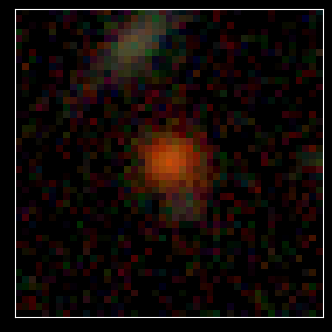

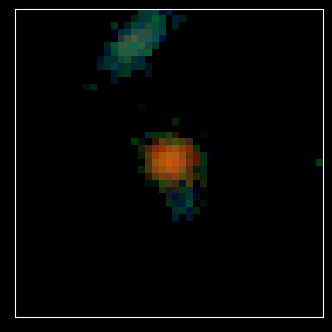

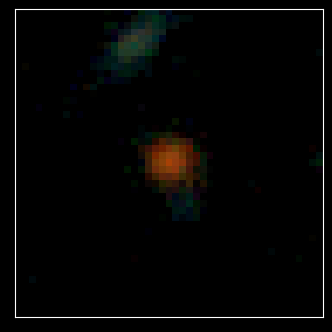

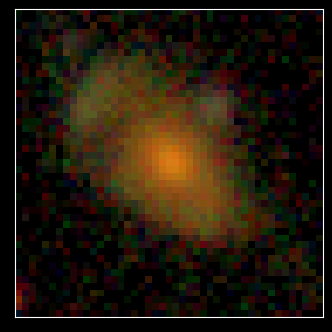

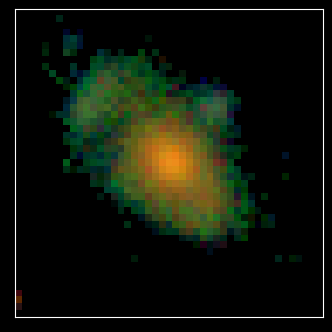

...

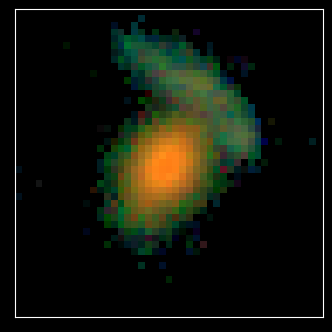

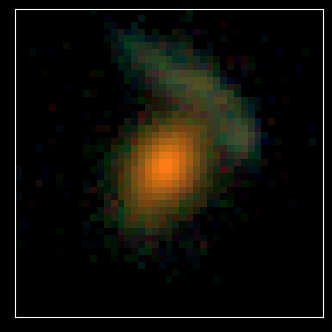

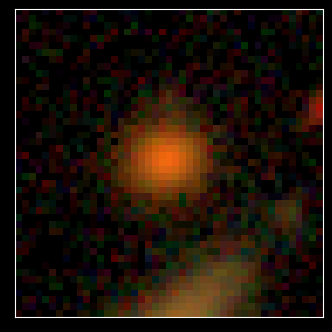

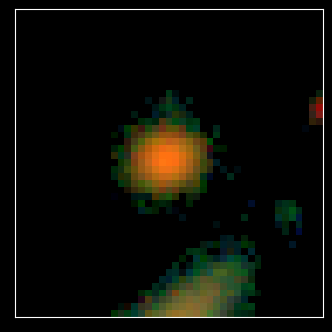

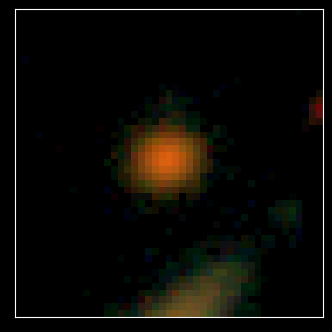

In [8]:
png_path = 'pngs/'

for i in range(len(data)):
    make_one_plot(images[i], data['#IMAGE_NAME_1'].iloc[i], data.iloc[i], 9, 42, (0,0,0)) # new first filter
    make_one_plot(images[i], data['#IMAGE_NAME_2'].iloc[i], data.iloc[i], 8, 35, (14,2,0)) # new second filter
    make_one_plot(images[i], data['#IMAGE_NAME_3'].iloc[i], data.iloc[i], 8, 70, (10,2,0)) # new third filter